# Проект: Рынок заведений общественного питания Москвы

## Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

В проекте необходимо подготовить исследование рынка Москвы, найти особенности и исследовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Для исследования представлен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

### Описание данных

Датасет включает в себя следующие данные:

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat — широта географической точки, в которой находится заведение;

lng — долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
1. «Средний счёт: 1000–1500 ₽»;
2. «Цена чашки капучино: 130–220 ₽»;
3. «Цена бокала пива: 400–600 ₽» и так далее;

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
1. Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
2. Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
3. Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

1. Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
2. Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
3. Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);

district — административный район, в котором находится заведение, например Центральный административный округ;

seats — количество посадочных мест.



### Ход исследования

1. Обзор данных.
2. Предобработка данных.
3. Расчет и добавление необходимых показателей.
4. Исследование данных.
5. Детализация исследования и рекомендации по открытию кофейни.
6. Ответы на вопросы и основной вывод.

## Изучение данных

In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install squarify

Note: you may need to restart the kernel to use updated packages.


Для работы с данными импортируем необходимые библиотеки

In [3]:
import pandas as pd
import matplotlib.pyplot as plt 
import numpy as np
import seaborn as sns
import re
from plotly import graph_objects as go 
import json
import folium
from folium import Map, Choropleth, Marker
import plotly.express as px
from folium.plugins import MarkerCluster
import squarify 

### Прочтение файлов и просмотр первых строк полученных таблиц

In [4]:
df = pd.read_csv('~/Desktop/project_files/moscow_places.csv')

In [5]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


### Изучение общей информации

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В нашем датасете 14 столбцов, имеются пропуски (в ходе предобработки выясним какие пропуски возможно заполнить данными), а также необходима проверка на дубликаты.

## Предобработка данных

### Приведение данных к нижнему регистру

Для удобства приведем все данные в двух столбцах к нижнему регистру. Таким образом, мы возможно избавимся от неявных дубликатах в названиях заведений, а изменение адресов понадобится для создания столбца с данными об улицах:

In [7]:
df['name'] = df['name'].str.lower()

In [8]:
df['address'] = df['address'].str.lower()

### Работа с пропусками

Для начала посмотрим количество пропусков и в каких столбцах они имеются:

In [9]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В столбце с указанием посадочных мест (seats) в заведении имеются 3611 пропусков. В связи с большим количеством факторов, влияющих на количество посадочных мест (в том числе в сети могут быть разные площадью заведения), заполнить данные пропуски медианными или средними значениями считаю некорректным, поэтому оставим пропуски без изменений.

### Работа со столбцами

Посмотрим на столбец с информацией о сетевых и несетевых заведениях:

In [10]:
df['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

Переименуем строки на "сетевые" и "несетевые".

In [11]:
df.loc[df['chain'] == 0, 'chain'] = 'несетевые'

In [12]:
df.loc[df['chain'] == 1, 'chain'] = 'сетевые'

### Проверка на дубликаты

In [13]:
print('Количество дубликатов:', df.duplicated().sum())

Количество дубликатов: 0


### Создание столбцов

Создадим список слов, которые могут стоять перед названием улицы либо после и применим регулярные выражения, создадим новый столбец с названиями улиц.

In [14]:
words = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория',
         'квартал','просек', 'парк','мост']
 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
 
df['street'] = df['address'].str.extract(str_pat, flags=re.I)

Если нет ключевых слов либо отсутствуют знаки препинания, то данный метод оставляет пропуски, поэтому оставшиеся пропуски заполним маркером и также будем иметь ввиду.

In [15]:
df['street'] = df['street'].fillna('unknown')

Также создадим столбец с информацией, работает ли заведение круглосуточно:

In [16]:
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [17]:
print('У нас получилось', len(df.query('is_24_7 == True')), 'круглосуточных заведений, работающих ежедневно!')

У нас получилось 730 круглосуточных заведений, работающих ежедневно!


В ходе предобработки мы проделали следующую работу:
1. Названия заведений и адреса их были приведены к нижнему регистру.
2. В столбце (chain), где хранится информация является ли заведение сетевым, изменены строки на "сетевые" и "несетевые"
3. Произведена проверка на дубликаты: не выявлено.
4. Дополнительно создано 2 столбца: с названием улиц, где расположено заведение (street) и является ли заведение круглосуточным (is_24_7).
5. Так как пропуски независимы друг от друга, а также независимы от других показателей, то ринято решение оставить их без изменений. Пропуски имеют ожидаемое значение NaN, которое позволяет производить операции со столбцом, не искажая результаты и не требуя дополнительных операций.

По итогам предобработки мы сохранили данные в первоначальном объеме.

## Исследование данных

### Анализ категорий объектов общественного питания

Для просмотра сгруппируем все заведения по категориям:

In [18]:
df_category = df.groupby('category').agg({'name' : 'count'}).reset_index()

In [19]:
df_category

,category,name
0,"бар,паб",765
1,булочная,256
2,быстрое питание,603
3,кафе,2378
4,кофейня,1413
5,пиццерия,633
6,ресторан,2043
7,столовая,315


In [20]:
df_category['percent'] =  ((df_category['name']/df_category['name'].sum()) * 100).round(1)
df_category.columns = ['категория', 'количество заведений', '% от общего количества заведений']
df_category.sort_values(by='количество заведений', ascending=False)


,категория,количество заведений,% от общего количества заведений
3,кафе,2378,28.3
6,ресторан,2043,24.3
4,кофейня,1413,16.8
0,"бар,паб",765,9.1
5,пиццерия,633,7.5
2,быстрое питание,603,7.2
7,столовая,315,3.7
1,булочная,256,3.0


 Визуализируем полученные данные:

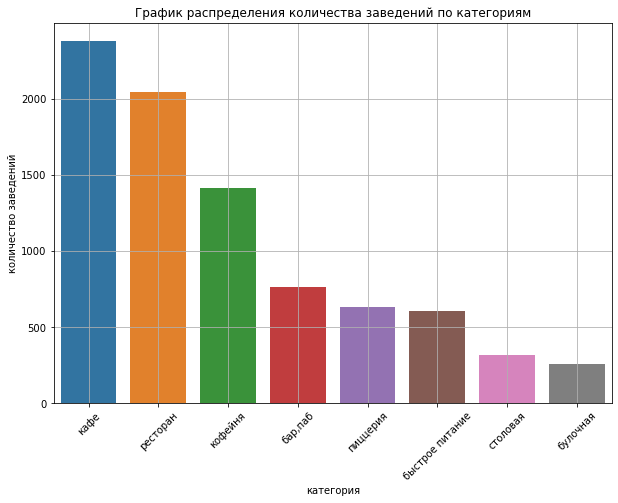

In [21]:
plt.figure(figsize=(10, 7))
sns.barplot(x='категория', y='количество заведений', data=df_category.sort_values(by='количество заведений', ascending=False))
plt.title('График распределения количества заведений по категориям')
plt.xlabel('категория')
plt.ylabel('количество заведений')
plt.xticks(rotation=45)
plt.grid()
plt.show()

Выше график отображает категории заведений в порядке убывания (слева направо). Ниже отобразим груговую диаграмму и посмотрим в процентном сооношении.

In [22]:
category = df_category['категория'].tolist()
values = df_category['количество заведений'].tolist()

In [23]:
fig = go.Figure(data=[go.Pie(labels=category, values=values)])
fig.update_layout(
    title={
        'text': "Распределение количества заведений по категориям",
        'y':0.9,
        'x':0.47,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

Согласно полученным данным лидирует категория заведений - кафе (2378 заведений или 28.3 % от общего числа представленных заведений). Если рассматривать тройку лидиров, то далее, рестораны - 2043 заведения (24.3 %) и кофейни - 1413 (16.8 %). Эта тройка лидеров занимает почти 70 % всех представленных заведений. Меньше всего заведений приходится на категорию столовая (3,7 %) и булочная (3 %).

### Исследование количества посадочных мест.

Сгруппируем данные по категориям заведений и выведим медианное значение, минимальные и максимальные.

In [24]:
seats = (
    df.pivot_table(index='category', values='seats', aggfunc=['median', 'min', 'max'])
    .reset_index()
)
seats.columns = ['category', 'median', 'min', 'max']
seats = seats.sort_values(by='median', ascending=False)
seats

,category,median,min,max
6,ресторан,86.0,0.0,1288.0
0,"бар,паб",82.5,0.0,1288.0
4,кофейня,80.0,0.0,1288.0
7,столовая,75.5,0.0,1200.0
2,быстрое питание,65.0,0.0,1040.0
3,кафе,60.0,0.0,1288.0
5,пиццерия,55.0,0.0,1288.0
1,булочная,50.0,0.0,625.0


Во всех категориях встречается нулевое количество посадочных мест и почти у всех свыше 1000 посадочных мест. Нельзя однозначно сказать, что эти данные являются аномалиями, так как в наше время нередко встречаются заведения, где возможно только "взять на вынос" или же банкетные залы с таким большим количеством посадочных мест (даже если это заведение является сетью, количество посадочных мест может кардинально отличаться). Все же больше внимание мы уделим медианным значениям. Как и следовало ожидать, на первом месте по количеству посадочных мест рестораны (86), в кофейнах - 80, меньше всего посадочных в булочных - 50.  

Посмотрим распределение количества посадочных мест на гистограмме и ниже также применим метод describe()

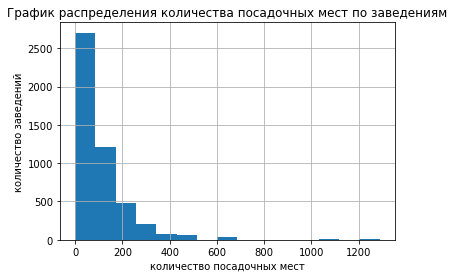

In [25]:
df.query('seats != -1').hist('seats', bins = 15)
plt.title('График распределения количества посадочных мест по заведениям')
plt.xlabel('количество посадочных мест')
plt.ylabel('количество заведений')
plt.show()

In [26]:
df.query('seats != -1')['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Все же большинство заведений имеет количество посадочных мест менее 200, поэтому необходимо посмотреть на медианные значения, убрав 0 и свыше 500 посадочных мест.

In [27]:
seats_without_stuffing = (
    df.query('seats < 500 and seats != 0')
    .pivot_table(index='category', values='seats', aggfunc=['median', 'min', 'max'])
    .reset_index()
)
seats_without_stuffing.columns = ['category', 'median', 'min', 'max']
seats_without_stuffing = seats_without_stuffing.sort_values(by='median', ascending=False)
seats_without_stuffing

,category,median,min,max
6,ресторан,86.0,2.0,495.0
0,"бар,паб",80.0,6.0,480.0
4,кофейня,80.0,2.0,491.0
7,столовая,76.0,4.0,428.0
2,быстрое питание,75.0,1.0,450.0
3,кафе,60.0,1.0,495.0
5,пиццерия,55.0,1.0,455.0
1,булочная,51.0,3.0,478.0


Данные не сильно изменились. Порядок возрастания количества посадочных мест остался прежним. Визуализируем данные, воспользуемся данные без "аномальных" значений:

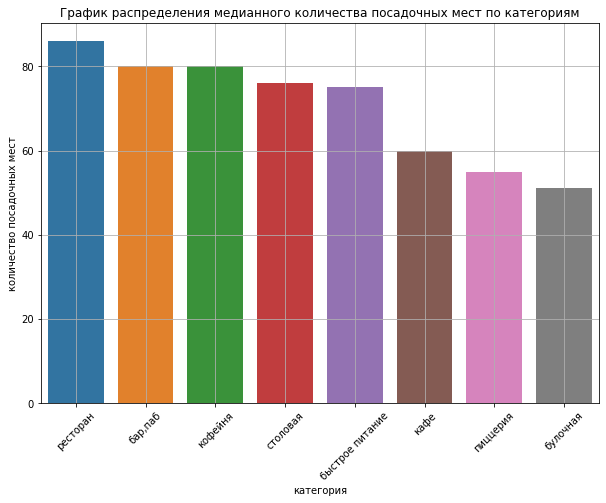

In [28]:
plt.figure(figsize=(10, 7))
sns.barplot(x='category', y='median', data=seats_without_stuffing)
plt.title('График распределения медианного количества посадочных мест по категориям')
plt.xlabel('категория')
plt.ylabel('количество посадочных мест')
plt.xticks(rotation=45)
plt.grid()
plt.show()

### Анализ сетевых и несетевых заведений.

Сгруппируем данные по столбцу "chain" и посмотрим соотношение сетевых и несетевых заведений:

In [29]:
df_net = (df.groupby('chain')
            .agg({'name' : 'count'})
            .sort_values(by='name', ascending=False)
            .reset_index()
         )

In [30]:
df_net.columns = ['статус заведения', 'количество заведений']
df_net

,статус заведения,количество заведений
0,несетевые,5201
1,сетевые,3205


Несетевые заведения преобладают, также визуализируем полученные данные.

In [31]:
category = df_net['статус заведения'].tolist()
values = df_net['количество заведений'].tolist()
fig = go.Figure(data=[go.Pie(labels=category, values=values)])
fig.update_layout(
    title={
        'text': "Диаграмма распределения сетевых/несетвых заведений",
        'y':0.9,
        'x':0.47,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

Согласно имеющимся данным, сетевых заведений составляет 38,1 % (или 3205 заведений от общего числа), несетевых - 61, 9 % (4201 заведение).

Теперь рассмотрим сетевые заведения по категориям:

In [32]:
chain_pivot = df.pivot_table(index='category', columns='chain', values='name', aggfunc='count').reset_index()
chain_pivot['доля от общего числа'] =  ((chain_pivot['сетевые']/df_category['количество заведений']) * 100).round(1)
chain_pivot

chain,category,несетевые,сетевые,доля от общего числа
0,"бар,паб",596,169,22.1
1,булочная,99,157,61.3
2,быстрое питание,371,232,38.5
3,кафе,1599,779,32.8
4,кофейня,693,720,51.0
5,пиццерия,303,330,52.1
6,ресторан,1313,730,35.7
7,столовая,227,88,27.9


In [33]:
chain_pivot['сетевые'].sum()

3205

У нас получилась сводная таблица с конкретными цифрами о количестве заведений по категориям  и статусу. Также, визуализируем отдельно сетевые заведения с разбивкой по категориям.

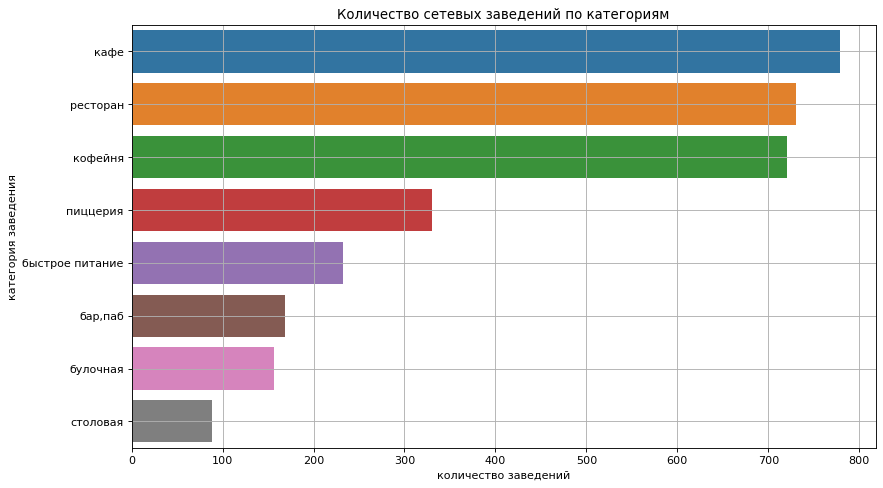

In [34]:
plt.figure(num=None, figsize=(12, 7), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x='сетевые', y='category', data=chain_pivot.sort_values(by='сетевые', ascending=False))
plt.title('Количество сетевых заведений по категориям')
plt.xlabel('количество заведений')
plt.ylabel('категория заведения')
plt.grid()
plt.show()

Тройка лидеров категорий объектов по количеству заведений среди сетевых:
1. "Кафе" - 779 (32,8 % от общего количества заведений данной категории)
2. "Рестораны" - 730 (35,7 %)
3. "Кофейни" - 720 (51 %)

Распределение количества заведений среди тройки лидеров довольно равномерное. Категории "Булочная" и "столовая" замыкают рейтинг, количество заведений этих категорий наименьшее среди всех (157 (61,3 %) и 88 (27,9 %) соответственно). Однако, стоит отметить, что % сетевых заведений категории "Булочная" составляет 61,3 %, "Пиццерия" - 52,1 % или "Кофейня" - 51 %. Такие высокие проценты в данных категориях говорят нам о том, что владельцы заведений предпочитают развивать сети среди указанных категорий.

Для наглядности построим график распределения долей сетевых заведений в категориях:

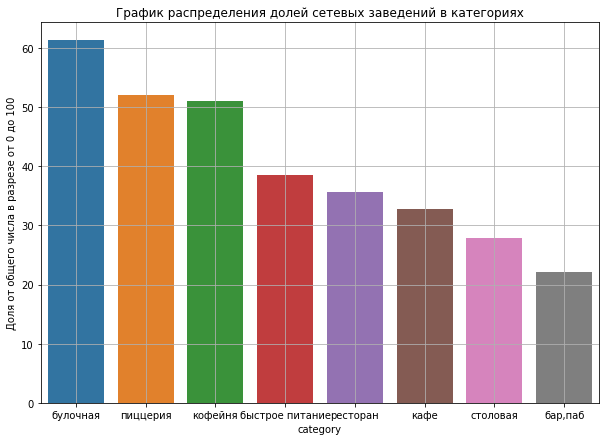

In [35]:
plt.figure(figsize=(10, 7))
sns.barplot(x='category', y='доля от общего числа', data=chain_pivot.sort_values(by='доля от общего числа', ascending=False))
plt.title('График распределения долей сетевых заведений в категориях')
plt.ylabel('Доля от общего числа в разрезе от 0 до 100')
plt.grid()
plt.show()

Тройка лидеров категорий с наибольшей долей сетевых заведений:
1. "Булочная" составляет 61,3 %
2. "Пиццерия" - 52,1 %
3. "Кофейня" - 51 %

Что объединяет эти категории: относительно других категорий небольшие вложения для открытия!

Бары/пабы имеют наименьшую долю сетевых заведений среди других категорий (22, 1 %).

### Определение топ-15 популярных сетей в Москве

Для определения топ-15 популярных сетевых заведений, сгруппируем данные по названию заведения, отсортируем в порядке убывания и сохраним первые 15 названий сетей: 

In [36]:
top_15 = (
    df.query('chain == "сетевые"')
    .groupby(['name'])
    .agg({'category': 'count'})
    .reset_index()
    .sort_values(by='category', ascending=False)
    .rename(columns={'name': 'название', 'category': 'количество заведений'})
)
top_15 = top_15.head(15)
top_15

,название,количество заведений
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


Пятерка лидеров по количеству заведений: 
1. Шоколадница - 120
2. Домино'с пицца - 76
3. Додо пицца - 74
4. Оne price coffee - 71
5. Яндекс лавка - 69

На мой взгляд все эти сети объединяет один фактор: заведения быстрого обслуживания. То есть, если взять сети Шоколадница и Оne price coffee, то это преимущество напитки (кофе и т.д.) и легкий перекус, оставшиеся заведения - это в большинстве случаев еда на вынос. Люди часто заказывают пиццу или готовые блюда домой или в офис. Немалую роль играет относительно невысокий ценовой диапазон.

Визуализируем эти данные для наглядности:

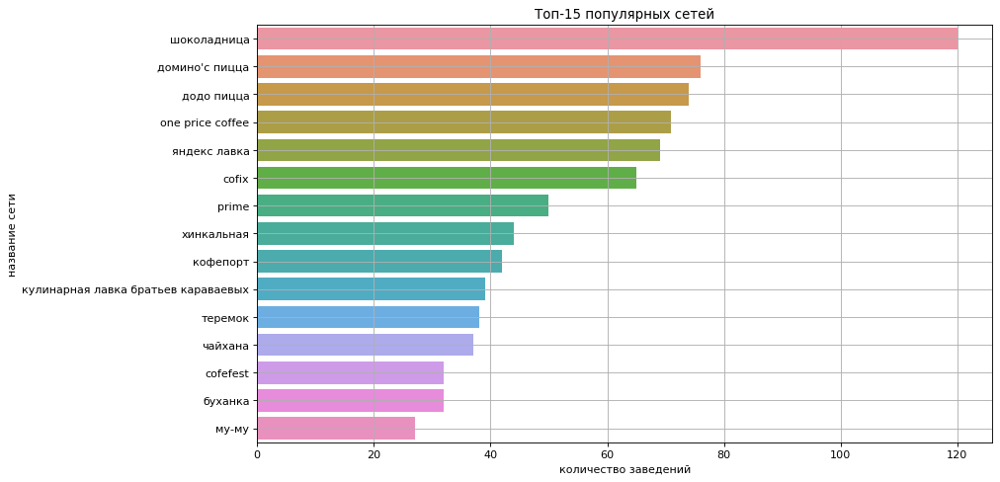

In [37]:
plt.figure(num=None, figsize=(12, 7), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x='количество заведений', y='название', data=top_15.head(15))
plt.title('Топ-15 популярных сетей')
plt.xlabel('количество заведений')
plt.ylabel('название сети')
plt.grid()
plt.show()

Рассмотрим эти сети с разбивкой по районам Москвы.

In [38]:
#преобразовываем данные в список
top_15_list = top_15['название'].to_list()

In [39]:
#методом query сохраняем в новой таблице только те заведения, которые входят в топ-15 сетей
df_top_15_name = df.query('name in @top_15_list').reset_index(drop=True)

In [40]:
df_top_15_name.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,сетевые,180.0,базовская улица,False
1,буханка,булочная,"москва, лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,сетевые,NaN,лобненская улица,False
2,додо пицца,пиццерия,"москва, коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,сетевые,46.0,коровинское шоссе,False


Для начала посмотрим сколько сетей из топ-15 представлено в разных районах Москвы:

In [41]:
df_district_un = (
    df_top_15_name.groupby(['district'])
    .agg({'name': 'nunique'})
    .reset_index()
    .sort_values(by='name', ascending=False)    
)
df_district_un

,district,name
0,Восточный административный округ,15
1,Западный административный округ,15
2,Северный административный округ,15
3,Северо-Восточный административный округ,15
5,Центральный административный округ,15
7,Юго-Западный административный округ,15
4,Северо-Западный административный округ,13
8,Южный административный округ,13
6,Юго-Восточный административный округ,10


Выше видно, что сети стараются захватить все основные районы Москвы. Распределение довольно равномерное. Тем не менее, меньше всего сетей(10 из 15) представлено в Юго-Восточном административном округе.

Теперь рассмотрим заведений топ-15 сетей по количеству заведений с разбивкой по районам:

In [42]:
df_district = (
    df_top_15_name.groupby(['district'])
    .agg({'name': 'count'})
    .reset_index()
    .sort_values(by='name', ascending=False)    
)
df_district

,district,name
5,Центральный административный округ,215
8,Южный административный округ,89
1,Западный административный округ,88
2,Северный административный округ,88
3,Северо-Восточный административный округ,85
0,Восточный административный округ,81
7,Юго-Западный административный округ,70
6,Юго-Восточный административный округ,56
4,Северо-Западный административный округ,46


In [43]:
category = df_district['district'].tolist()
values = df_district['name'].tolist()
fig = go.Figure(data=[go.Pie(labels=category, values=values)])
fig.update_layout(
    title={
        'text': "Диаграмма распределения количества заведений среди топ-15 сетей с разбивкой по районам",
        'y':0.9,
        'x':0.47,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

Как и следовало ожидать, по количеству заведений лидирует Центральный административный округ (215 заведений из 818 по выборке топ-15 сетей). Так как в центральных районах всегда высокая проходимость. Далее, Южный административный округ - 89, Западный административный округ - 88 заведений,. Меньше всего популярных сетевых заведений представлено в Северо-Западный административный округ - 46 заведений. Предположу, что это связано с тем, что данный район считается "спальным",  также немаловажный фактор, это довольно дорогой район для жизни, в нашем топ-15 сетей представлены недорогие заведения, возможно они не пользуются такой популярностью в этом районе.

Теперь рассмотрим эти же сети с разбивкой по категориям:

In [44]:
df_categor = (
    df_top_15_name.groupby(['category'])
    .agg({'name': 'count'})
    .reset_index()
    .sort_values(by='name', ascending=False)    
)
df_categor

,category,name
4,кофейня,337
6,ресторан,186
5,пиццерия,152
3,кафе,100
1,булочная,25
2,быстрое питание,12
0,"бар,паб",4
7,столовая,2


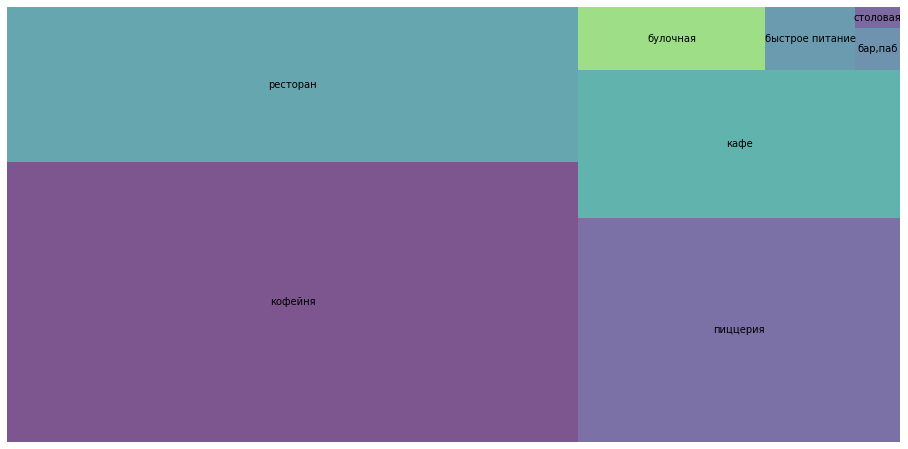

In [45]:
plt.figure(figsize=(16, 8))
squarify.plot(sizes=df_categor['name'], label=df_categor['category'], alpha=.7)
plt.axis('off')
plt.show()

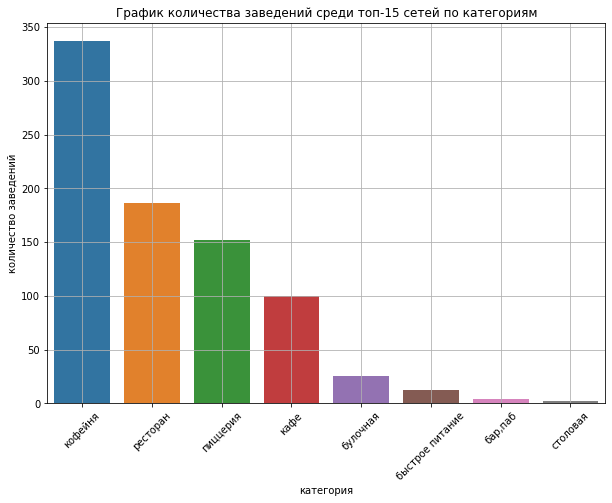

In [46]:
plt.figure(figsize=(10, 7))
sns.barplot(x='category', y='name', data=df_categor)
plt.title('График количества заведений среди топ-15 сетей по категориям')
plt.xlabel('категория')
plt.ylabel('количество заведений')
plt.xticks(rotation=45)
plt.grid()
plt.show()

Кофейни лидируют (337 заведений из 818 по выборке топ-15 сетей). Далее, рестораны - 186, пиццерия - 152. Меньше всего заведений представлено в категориях столовая (2), бар/паб (4) и быстрое питание (12).

Теперь сгруппируем данные по району и категориям подсчитаем количество заведений среди популярных сетей:

In [47]:
df_category_district = (
    df_top_15_name.groupby(['district', 'category'])
    .agg({'name': 'count'})
    .reset_index()
    .sort_values(by='name', ascending=False)
    .rename(columns={'district': 'район', 'category': 'категория заведения', 'name': 'количество заведений'})
)
df_category_district.head()

,район,категория заведения,количество заведений
35,Центральный административный округ,кофейня,95
37,Центральный административный округ,ресторан,59
34,Центральный административный округ,кафе,47
11,Западный административный округ,кофейня,41
16,Северный административный округ,кофейня,40


В данном случае визуализация будет нагляднее и информативнее:

In [48]:
fig = px.bar(df_category_district, x='количество заведений', y='район', color="категория заведения", 
             title='График распределения количества заведений по категориям и районам топ-15 сетей')
fig.update_layout(barmode='stack', yaxis={'categoryorder':'total descending'})
fig.show()

Если рассматривать центр Москвы, то популярнее здесь кофейни, как и Западном, Северном и Северо-Восточном округах. На что обратила внимание, что в центре по сравнению с другими районами представлено меньше всего заведений категории пиццерии.

### Исследование районов Москвы

Для начала сгруппируем данные по районам и посмотрим общее количество заведений.

In [49]:
df_dis = (
    df.groupby(['district'])
    .agg({'name': 'count'})
    .reset_index()
    .sort_values(by='name', ascending=False)    
)
df_dis['percent'] =  ((df_dis['name']/df_dis['name'].sum()) * 100).round(1)
df_dis

,district,name,percent
5,Центральный административный округ,2242,26.7
2,Северный административный округ,900,10.7
8,Южный административный округ,892,10.6
3,Северо-Восточный административный округ,891,10.6
1,Западный административный округ,851,10.1
0,Восточный административный округ,798,9.5
6,Юго-Восточный административный округ,714,8.5
7,Юго-Западный административный округ,709,8.4
4,Северо-Западный административный округ,409,4.9


In [50]:
print('Общее количество заведений составляет: ', df_dis['name'].sum())

Общее количество заведений составляет:  8406


3-ка лидеров по количеству заведений:
1. Центральный административный округ - 2242 (26.7 %)
2. Северный административный округ - 900 (10.7 %)
3. Южный административный округ - 892 (10.6 %)

На последнем месте по количеству заведений Северо-Западный административный округ - 409	заведений (4.9 %)

Визуализируем наши данные:

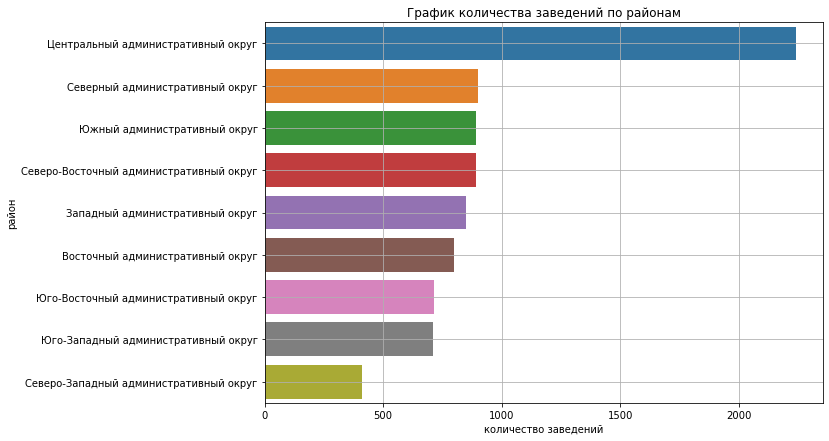

In [51]:
plt.figure(figsize=(10, 7))
sns.barplot(y='district', x='name', data=df_dis)
plt.title('График количества заведений по районам')
plt.ylabel('район')
plt.xlabel('количество заведений')
plt.grid()
plt.show()

Теперь посмотрим количество заведений с разбивкой по районам и категориям:

In [52]:
df_cate_dis = (
    df.groupby(['district', 'category'])
    .agg({'name': 'count'})
    .reset_index()
    .sort_values(by='name', ascending=False)    
)
df_cate_dis.head()

,district,category,name
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282


Эффективнее в данном случае будет визуализация:

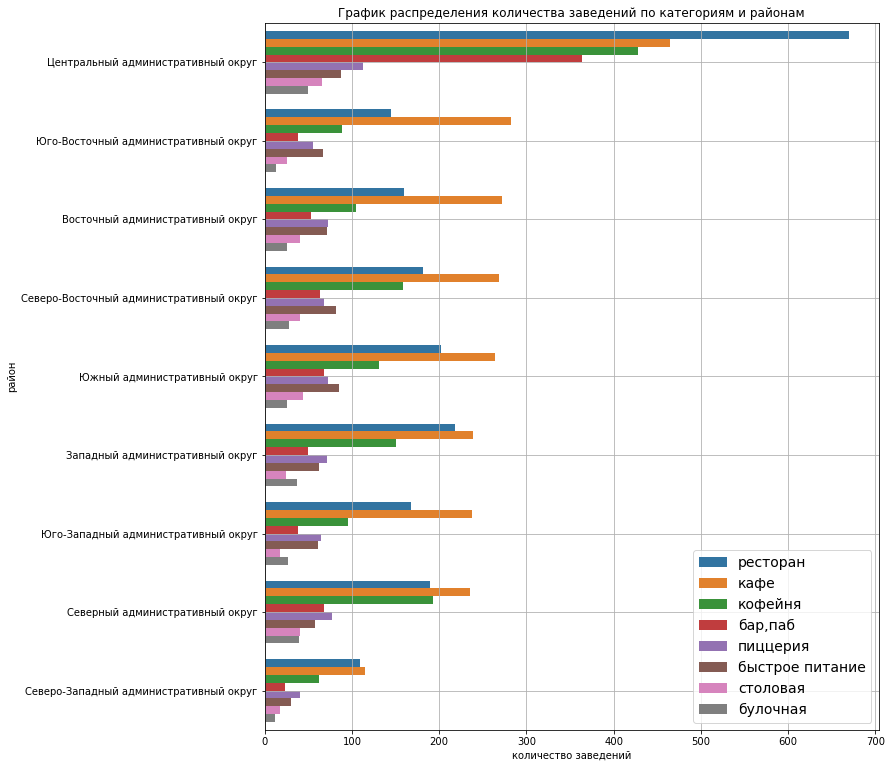

In [53]:
plt.figure(figsize=(11, 13))
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='district', data=df_cate_dis, hue='category')
plt.title('График распределения количества заведений по категориям и районам')
plt.xlabel('количество заведений')
plt.ylabel('район')
plt.legend(loc='lower right', fontsize=14)
plt.grid()
plt.show()

Во всех районах Москвы выделяется тройка лидеров среди категорий заведений: кафе, рестораны и кофейни.

### Распределение средних рейтингов по категориям заведений

Сгруппируем данные по категориям и выведем медианный рейтинг заведений:

In [54]:
df_rating = (
    df.groupby(['category'])
    .agg({'rating': 'median'})
    .reset_index()
    .sort_values(by='rating', ascending=False)    
)
df_rating

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


Медианный рейтинг среди категорий практически не отличается. Самый высокий рейтинг в категории бары/пабы - 4.4, у 5-ти категорий рейтинг - 4.3, в быстром питании и кафе - 4,2.

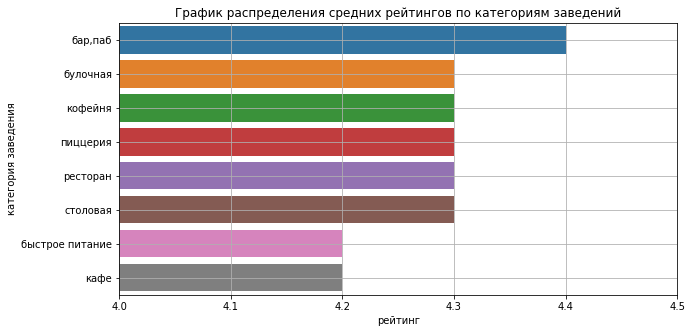

In [55]:
plt.figure(figsize=(10, 5))
sns.barplot(x='rating', y='category', data=df_rating)
plt.title('График распределения средних рейтингов по категориям заведений')
plt.ylabel('категория заведения')
plt.xlabel('рейтинг')
plt.xlim([4, 4.5])
plt.grid()
plt.show()

На графике также видно, что различия несущественны.

### Фоновая картограмма (хороплет) со средним (медианным) рейтингом заведений каждого района

Перед построением карты сгруппируем данные по районам и подсчитаем медианный рейтинг каждого.

In [56]:
df_rating_district = (
    df.groupby(['district'])
    .agg({'rating': 'median'})
    .reset_index()    
)
df_rating_district

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


Всего 9 районов, у 6-ти из которых рейтинг заведений составляет 4.3, самый высокий рейтинг в ЦАО - 4.4. Такая несущественная разница говорит о том, что район не влияет на рейтинг заведений, по крайней мере исходя из наших данных.

In [57]:
state_geo = '~/Desktop/project_files/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [58]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

### Отображение всех имеющихся заведений на карте

In [59]:
m_name = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_name)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m_name

### Топ-15 улиц по количеству заведений

Так как у нас имеются маркеры в столбце с названиями улиц, то мы их учитывать при группировке не будем.

In [60]:
top_15_street_all = (
    df.query('street != "unknown"')
    .groupby(['street'])
    .agg({'name': 'count'})
    .reset_index()
    .sort_values(by='name', ascending=False)
    .rename(columns={'street': 'название улицы', 'name': 'количество_заведений'})
)
top_15_street = top_15_street_all.head(15)
top_15_street

,название улицы,количество_заведений
797,проспект мира,184
801,профсоюзная улица,122
794,проспект вернадского,108
520,ленинский проспект,107
518,ленинградский проспект,95
370,дмитровское шоссе,88
451,каширское шоссе,77
300,варшавское шоссе,75
519,ленинградское шоссе,69
596,мкад,65


Выделим 4-ку улиц-лидеров по количеству заведений:
1. Проспект мира - 184
2. Профсоюзная улица - 122
3. Проспект вернадского - 108
4. Ленинский проспект - 107

Для наглядности визуализируем эти данные:

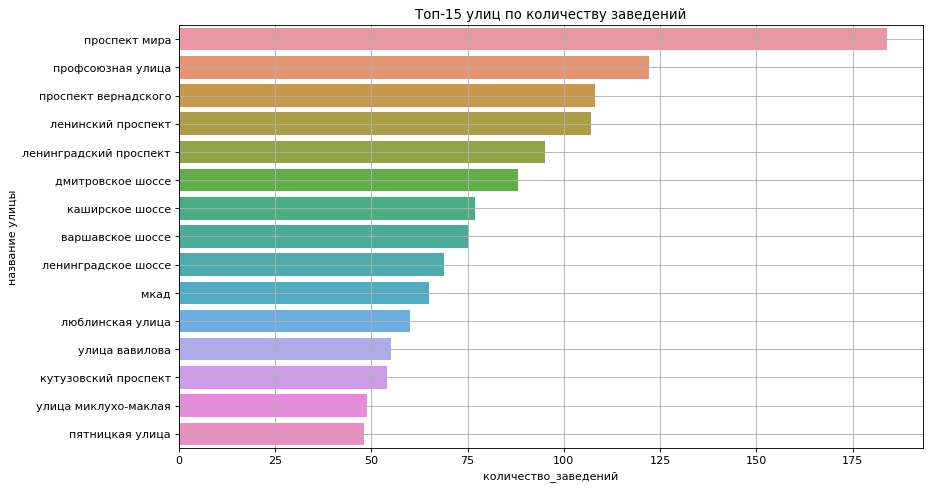

In [61]:
plt.figure(num=None, figsize=(12, 7), dpi=80, facecolor='w', edgecolor='k')
sns.barplot(x='количество_заведений', y='название улицы', data=top_15_street)
plt.title('Топ-15 улиц по количеству заведений')
plt.grid()
plt.show()

Теперь, для того, чтобы разбить по улицам и категориям, мы перенесем данные о 15-ти популярных улиц в список, отберем их названия в изначальном датасете, сгруппируем по названию улиц и категории и посмотрим количество заведений:

In [62]:
top_15_street_list = top_15_street['название улицы'].to_list()

In [63]:
df_top_15_street = df.query('street in @top_15_street_list').reset_index(drop=True)

In [64]:
df_category_street = (
    df_top_15_street.groupby(['street', 'category'])
    .agg({'name': 'count'})
    .reset_index()
    .sort_values(by='name', ascending=False)
    .rename(columns={'street': 'название улицы', 'category': 'категория заведения', 'name': 'количество заведений'})
)
df_category_street.head()

,название улицы,категория заведения,количество заведений
78,проспект мира,кафе,53
63,мкад,кафе,45
81,проспект мира,ресторан,45
79,проспект мира,кофейня,36
86,профсоюзная улица,кафе,35


In [65]:
fig = px.bar(df_category_street, x='количество заведений', y='название улицы', color="категория заведения", 
             title='График распределения количества заведений по категориям на топ-15 улиц')
fig.update_layout(barmode='stack', yaxis={'categoryorder':'total descending'})
fig.show()

Ленинский проспект, проспект Вернадского - это довольно дорогие районы, я думаю с этим связано преобладание категории рестораны. Если взять МКАД, то здесь лидируют кафе. Ресторан предполагает скорее времяпровождение, кафе же сосредоточено больше на еде. Проспект мира - это центр, поэтому здесь в большом количестве представлены все основные категории - кафе, ресторан, кофейни и быстрое питание.

#### Улицы с одним объектом общественного питания

Выделим улицs с 1-м объектом общественного питания:

In [66]:
one_pablic = top_15_street_all.query('количество_заведений == 1')
one_pablic

,название улицы,количество_заведений
1245,улица речников,1
1386,яковоапостольский переулок,1
1206,улица олеко дундича,1
1075,улица демьяна бедного,1
1066,улица годовикова,1
...,...,...
686,октябрьский переулок,1
691,ордынский тупик,1
692,оренбургская улица,1
695,орловский переулок,1


In [67]:
one_pablic_list = one_pablic['название улицы'].to_list()

In [68]:
df_one_pablic = df.query('street in @one_pablic_list').reset_index(drop=True)

In [69]:
one_name = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}"
    ).add_to(one_name)

# применяем функцию для создания маркера ко всем строкам датафрейма
df_one_pablic.apply(create_marker, axis=1)
    
# выводим карту
one_name

Если увеличить карту и рассмотреть внимательно, что расположено рядом с этими заведениями, то видно, что одиночные заведения расположены как правило в "спальных" районах, а именно где только многоквартирные здания, а также где расположены предприятия, небольшие офисные здания, в государственных организациях(больницы). Также, одиночные заведения присутствуют в небольших парках. В таким районах (местах) проходимость невысокая, поэтому предприниматели не открывают много заведений в данных расположениях.

### Анализ средних чеков  объектов общественного питания

Сгруппируем данные по районам и выведем медианные показатели средних чеков.

In [70]:
df_bill_district = (
    df.query('middle_avg_bill != -1')
    .groupby(['district'])
    .agg({'middle_avg_bill': 'median'})
    .reset_index()    
)
df_bill_district

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


По средним чекам лидируют ЦАО (1000) и ЗАО (1000). Самый низкий средний чек в Юго-Восточном округе (450). Предположу, что это обусловленно, в первую очередь, ценами на аренду помещения, а также ценами на жилье, отсюда и сегмент граждан разный.

## Детализация исследования: открытие кофейни

Теперь более внимательно рассмотрим категорию "Кофейня". Поместим все заведения, входящие в данную категорию в отдельную таблицу:

In [71]:
df_coffee_house = df.query('category == "кофейня"').reset_index(drop=True)

In [72]:
print('Всего заведений категории кофеен: ', len(df_coffee_house))

Всего заведений категории кофеен:  1413


Посмотрим распределение кофеен по районам:

In [73]:
df_coffee = (
    df_coffee_house.groupby(['district'])
    .agg({'category': 'count'})
    .reset_index()
    .sort_values(by='category', ascending=False)
)
df_coffee['percent'] =  ((df_coffee['category']/df_coffee['category'].sum()) * 100).round(1)
df_coffee

,district,category,percent
5,Центральный административный округ,428,30.3
2,Северный административный округ,193,13.7
3,Северо-Восточный административный округ,159,11.3
1,Западный административный округ,150,10.6
8,Южный административный округ,131,9.3
0,Восточный административный округ,105,7.4
7,Юго-Западный административный округ,96,6.8
6,Юго-Восточный административный округ,89,6.3
4,Северо-Западный административный округ,62,4.4


In [74]:
category = df_coffee['district'].tolist()
values = df_coffee['category'].tolist()
fig = go.Figure(data=[go.Pie(labels=category, values=values)])
fig.update_layout(
    title={
        'text': "Диаграмма распределения количества кофеен по районам",
        'y':0.9,
        'x':0.47,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

Тройка лидеров по количеству кофеен по районам Москвы:
1. Центральный административный округ - 428	(30.3 %)
2. Северный административный округ - 193 (13.7 %)
3. Северо-Восточный административный округ - 159 (11.3 %)

Наименьшее количество кофеен представлено в Северо-Западном округе - 62 кофейни (4,4 % от общего числа кофеен)

Теперь рассмотрим круглосуточные кофейни:

In [75]:
df_coffee_all_time = (
    df_coffee_house.query('is_24_7 == True')
    .groupby(['district'])
    .agg({'category': 'count'})
    .reset_index()
    .sort_values(by='category', ascending=False)
)
df_coffee_all_time

,district,category
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [76]:
print('Всего круглосуточных кофеен: ', df_coffee_all_time['category'].sum())

Всего круглосуточных кофеен:  59


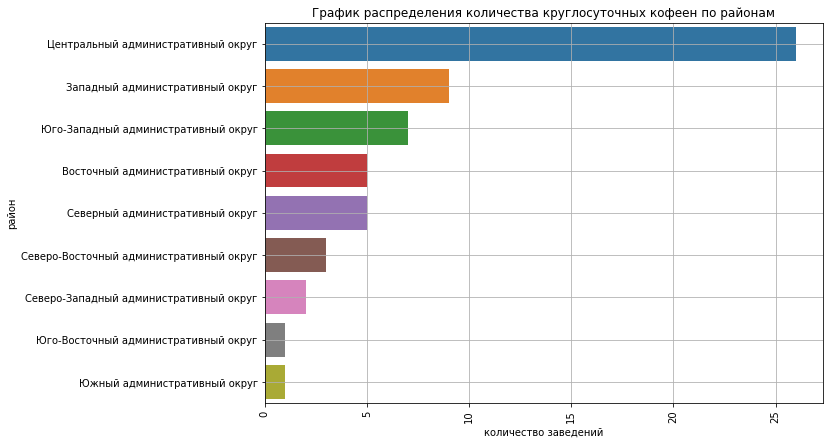

In [77]:
plt.figure(figsize=(10, 7))
sns.barplot(x='category', y='district', data=df_coffee_all_time)
plt.title('График распределения количества круглосуточных кофеен по районам')
plt.ylabel('район')
plt.xlabel('количество заведений')
plt.xticks(rotation=90)
plt.grid()
plt.show()

Круглосуточных кофеен не так уж и много, всего 59, из них 26 находятся в Центральном районе Москвы (44 %), так как обычно люди в ночное время предпочитают проводить время в центре города.

In [78]:
df_coffee_rating = (
    df_coffee_house.groupby(['district'])
    .agg({'rating': 'median'})
    .reset_index()
    .sort_values(by='rating', ascending=False)
)
df_coffee_rating

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


Если расматривать медианный рейтинг кофеен по районам, лишь в ЗАО он составляет 4.2, в остальных районах он 4,3. Таким образом, район не влияет на рейтинг кофеен.

Теперь рассмотрим среднюю стоимость чашки кофе с разбивкой по районам:

In [79]:
df_coffee_middle_cup = (
    df_coffee_house.groupby(['district'])
    .agg({'middle_coffee_cup': 'median'})
    .reset_index()
    .sort_values(by='middle_coffee_cup', ascending=False)
)
df_coffee_middle_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


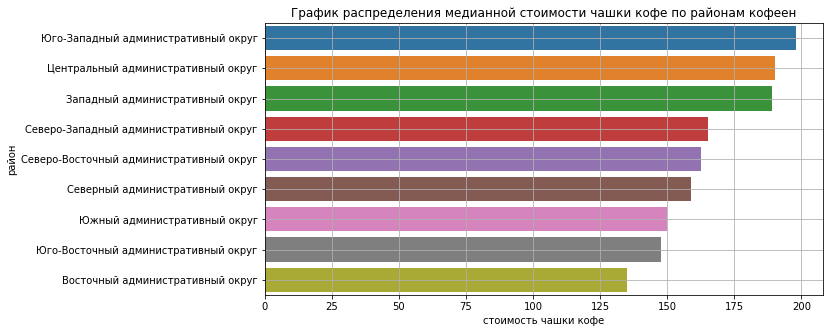

In [80]:
plt.figure(figsize=(10, 5))
sns.barplot(x='middle_coffee_cup', y='district', data=df_coffee_middle_cup)
plt.title('График распределения медианной стоимости чашки кофе по районам кофеен')
plt.ylabel('район')
plt.xlabel('стоимость чашки кофе')
plt.grid()
plt.show()

Чем выше аренда, тем выше стоимость меню. Юго-Западный и Центральный районы - одни из самых дорогих районов Москвы, отсюда и цена чашки кофе: 198 и 190 соответственно. А вот дешевле всего выпить кофе в Восточном округе - 135 за чашку.

## Общий вывод

Для исследования представлен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Необходимо было подготовить исследование рынка Москвы, найти особенности и исследовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места для открытия своего заведения (кофейни).

Перед началом исследования была проделана следующая обработка данных:
1. Названия заведений и адреса их были приведены к нижнему регистру.
2. В столбце (chain), где хранится информация является ли заведение сетевым, изменены строки на "сетевые" и "несетевые"
3. Произведена проверка на дубликаты: не выявлено.
4. Дополнительно создано 2 столбца: с названием улиц, где расположено заведение (street) и является ли заведение круглосуточным (is_24_7).

В датасете представлены следующие 8 категорий заведений с количеством заведений:

1. кафе - 2378 заведений (28.3 % от общего числа)
2. ресторан - 2043 (24.3 %)
3. кофейня - 1413 (16.8%)
4. бар,паб - 765 (9.1 %)
5. пиццерия - 633 (7.5 %)
6. быстрое питание - 603 (7.2 %)
7. столовая - 315 (3.7 %)
8. булочная - 256 (3 %)

Если рассматривать количество посадочных мест, то во всех категориях встречается нулевое количество посадочных мест и почти у всех свыше 1000 посадочных мест. Нельзя однозначно сказать, что эти данные являются аномалиями, так как в наше время нередко встречаются заведения, где возможно только "взять на вынос" или же банкетные залы с таким большим количеством посадочных мест (даже если это заведение является сетью, количество посадочных мест может кардинально отличаться). Все же больше внимание мы уделим медианным значениям. Как и следовало ожидать, на первом месте по количеству посадочных мест рестораны (86), в кофейнах - 80, меньше всего посадочных в булочных - 50.

Согласно имеющимся данным, сетевых заведений составляет 38,1 % (или 3205 заведений от общего числа), несетевых - 61, 9 % (4201 заведение).

Тройка лидеров категорий с наибольшим количеством сетевых заведений:
1. "Булочная" составляет 61,3 %
2. "Пиццерия" - 52,1 %
3. "Кофейня" - 51 %

Бары/пабы имеют наименьшую долю сетевых заведений среди других категорий (22, 1 %).

Рассмотрим самые популярные сети. На первом месте заведения под названием "Кафе". Можно также предположить, что данные заведения не являются сетью, так как разные владельцы заведений могли назвать обобщенно "Кафе". Обратим внимание на следующую пятерку лидеров по количеству заведений: 
1. Шоколадница	120
2. Домино'с пицца	76
3. Додо пицца	74
4. Оne price coffee	71
5. Яндекс лавка	69

На мой взгляд все эти сети объединяет один фактор: заведения быстрого обслуживания. То есть, если взять сети Шоколадница и Оne price coffee, то это преимущество напитки (кофе и т.д.) и легкий перекус, оставшиеся заведения - это в большинстве случаев еда на вынос. Люди часто заказывают пиццу или готовые блюда домой или в офис. Немалую роль играет относительно невысокий ценовой диапазон.

Вместе с тем, сети стараются захватить все основные районы Москвы. Распределение довольно равномерное. Тем не менее, меньше всего сетей(10 из 15) представлено в Юго-Восточном административном округе. По количеству заведений лидирует Центральный административный округ (215 заведений из 818 по выборке топ-15 сетей). Так как в центральных районах всегда высокая проходимость. Далее, Южный административный округ - 89, Западный административный округ - 88 заведений,. Меньше всего популярных сетевых заведений представлено в Северо-Западный административный округ - 46 заведений. 

Если рассматривать популярные сети с разбивкой по категориям, то кофейни лидируют (337 заведений из 818 по выборке топ-15 сетей). Далее, рестораны - 186, пиццерия - 152. Меньше всего заведений представлено в категориях столовая (2), бар/паб (4) и быстрое питание (12).

3-ка лидеров по количеству заведений:

1. Центральный административный округ - 2242 (26.7 %)
2. Северный административный округ - 900 (10.7 %)
3. Южный административный округ - 892 (10.6 %)

На последнем месте по количеству заведений Северо-Западный административный округ - 409 заведений (4.9 %)

Во всех районах Москвы выделяется тройка лидеров среди категорий заведений: кафе, рестораны и кофейни.

Медианный рейтинг среди категорий практически не отличается. Самый высокий рейтинг в категории бары/пабы - 4.4, у 5-ти категорий рейтинг - 4.3, в быстром питании и кафе - 4,2. 

Всего 9 районов, у 6-ти из которых рейтинг заведений составляет 4.3, самый высокий рейтинг в ЦАО - 4.4. Такая несущественная разница говорит о том, что район не влияет на рейтинг заведений, исходя из наших данных.

Выделим 4-ку улиц-лидеров по количеству заведений:

1. Проспект мира - 184
2. Профсоюзная улица - 122
3. Проспект Вернадского - 108
4. Ленинский проспект - 107

Ленинский проспект, проспект Вернадского - это довольно дорогие районы, я думаю с этим связано преобладание категории рестораны. Если взять МКАД, то здесь лидируют кафе. Ресторан предполагает скорее времяпровождение, кафе же сосредоточено больше на еде. Проспект мира - это центр, поэтому здесь в большом количестве представлены все основные категории - кафе, ресторан, кофейни и быстрое питание.

Вместе с тем, анализ показывает, что одиночные заведения расположены как правило в "спальных" районах, а именно где только многоквартирные здания, а также где расположены предприятия, небольшие офисные здания. В таким районах проходимость невысокая, поэтому предприниматели не открывают много заведений в данных расположениях.

По средним чекам лидируют ЦАО (1000) и ЗАО (1000). Самый низкий средний чек в Юго-Восточном округе (450). Предположу, что это обусловленно, в первую очередь, ценами на аренду помещения, а также ценами на жилье, отсюда и сегмент граждан разный.

Основные тезисы по исследованию категории "Кофейня":

Всего заведений категории кофеен:  1413

Тройка лидеров по количеству кофеен по районам Москвы:

1. Центральный административный округ - 428 (30.3 %)
2. Северный административный округ - 193 (13.7 %)
3. Северо-Восточный административный округ - 159 (11.3 %)

Наименьшее количество кофеен представлено в Северо-Западном округе - 62 кофейни (4,4 % от общего числа кофеен)

Круглосуточных кофеен не так уж и много, всего 59, из них 26 находятся в Центральном районе Москвы (44 %), так как обычно люди в ночное время предпочитают проводить время в центре города.

Если расматривать медианный рейтинг кофеен по районам, лишь в ЗАО он составляет 4.2, в остальных районах он 4,3. Таким образом, район не влияет на рейтинг кофеен.

Чем выше аренда, тем выше стоимость меню. Юго-Западный и Центральный районы - одни из самых дорогих районов Москвы, цена чашки кофе: 198 и 190 соответственно. Минимальная стоимость чашки кофе в Восточном округе - 135.

Рекомендации по открытию кофейни:
1. Расположение - это один из важнейших факторов успеха. Центральный округ - это огромная проходимость, огромная конкуренция и высокая аренда на помещение. Я бы не советовала открывать в этом округе, если у заказчика это первая кофейня, очень много рисков и затрат. Москва - стремительно развивающийся город, поэтому возможно стоит обратить внимание на округа, где в настоящее время наименьшее количество кофеен, например, Западный административный округ. Главное, обратить внимание не только на район, но и на оживленность улицы, где планируют открывать заведение, большим плюсом является шаговая доступность метро.
2. Согласно нашему исследованию, средняя стоимость чашки кофе в ЗАО составляет 189 рублей, если ориентироваться на конкурентов, то можно установить цену на чашку кофе примерно 185 рублей.
3. В основном, круглосуточные заведения популярны в центре, поэтому если не рассматривать ЦАО, то я бы не рекомендовала график работы 24/7.
4. Согласно исследованиям, ориентировочное количество посадочных мест в заведениях категории "кофейня" составляет 80.


Презентация: https://disk.yandex.ru/i/c_vJfVEpZeRCPg